# <font color='blue'> Table Of Contents </font>

### <font color='blue'> Problem Statement </font>

### <font color='blue'> EC2 Instance Creation </font>

### <font color='blue'> Node-Red : Flow Creation </font>

### <font color='blue'> Node-Red : Dashboard </font>



In the IoT Analytics Main notebook, raw data is being received from the script and pushed for anlysis. 

We have created the channels, datastores, datsets and pipelines to implement the anlytics. 

Once these services were up and running, we created a notebook which was essentially finding the anomaly using PEWM algorithm.

The visualization part where we can can view the raw as well as anomaly data for each data points separately was not available. 

There are multiple ways to create a visualization dashboard for monitoring and real-time reporting purposes including AWS QuickSight. 

We are going to use node-red dashboard to highlight creation of a basic dashboard which can be further extended for various use cases.

Instead of hosting this service locally, we are going to use another AWS service known as EC2. **You can of course install node-red on your local machine and use that too.** 

We will create an instance and we will run our node-red service there. Dashboard for our IoT data will also be hosted over the public IP of the instance. 

Let move ahead with the basic setup of EC2 instance. 



# <font color='blue'> EC2 Instance Creation </font>

In this section we will set up an EC2 instance 

1. Login in to the AWS Educate Account

2. Type EC2 in the search box of list of services

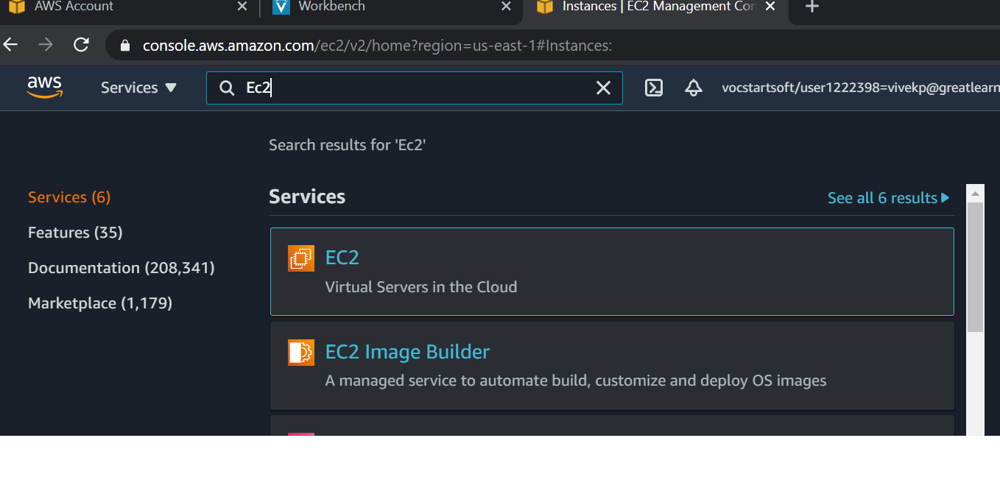



3.On the EC2 dashboard, click on `instances` on the left hand side menu

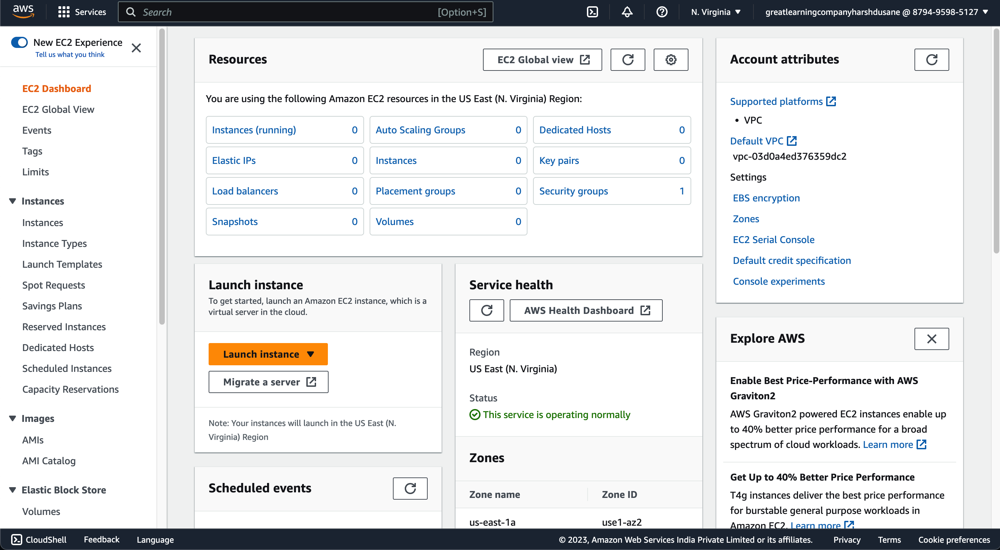

4. On the right hand side, click on Launch Instances

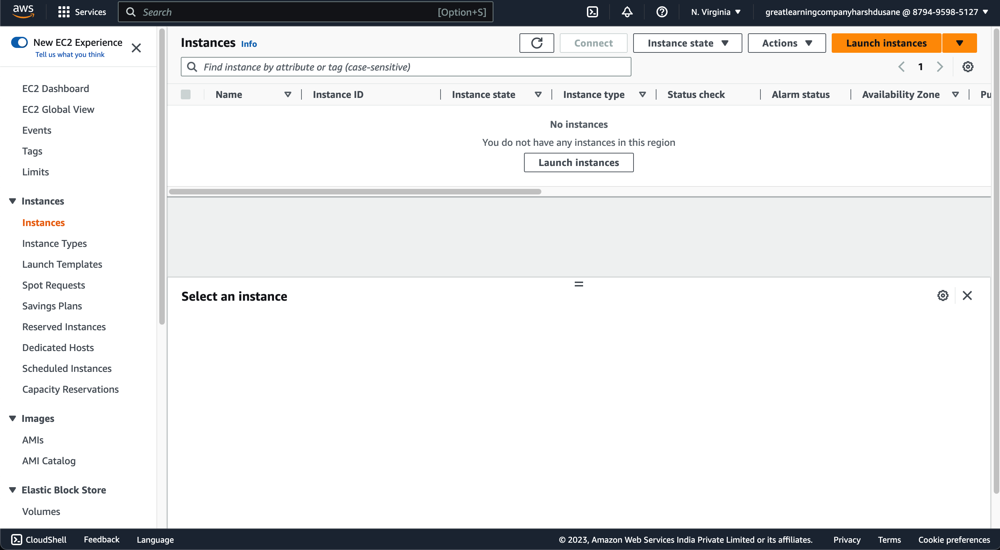

5. Enter name for the instance

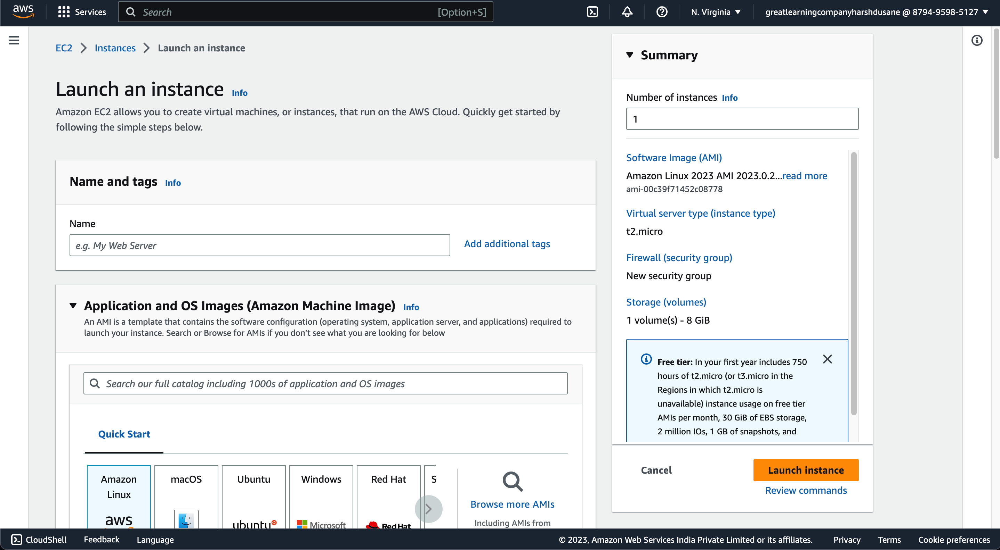

6. An Amazon Machine Image (AMI) provides the information required to launch an instance. Choose the AMI as Amazon Linux 2 AMI (HVM), SSD Volume Type. You can choose any other Linux OS as well if you are comfortable with the configuration on that.

    An AMI includes the following:
    
   a. One or more Amazon Elastic Block Store (Amazon EBS) snapshots, or, for instance-store-backed AMIs, a template for the root volume of the instance (for example, an operating system, an application server, and applications).

   b.Launch permissions that control which AWS accounts can use the AMI to launch instances.

   c.A block device mapping that specifies the volumes to attach to the instance when it's launched.


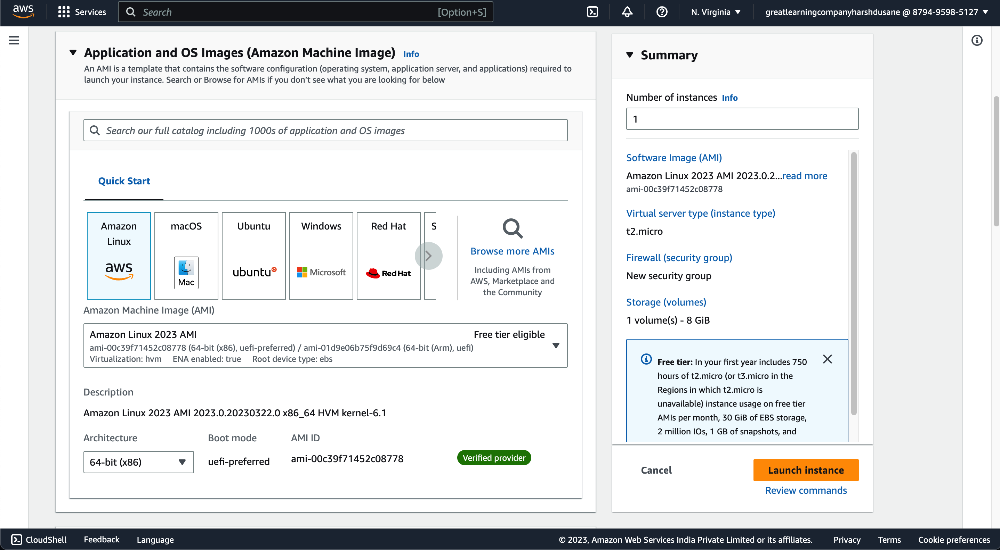


7. Instance types comprise varying combinations of CPU, memory, storage, and networking capacity and give you the flexibility to choose the appropriate mix of resources for your applications. 

    Each instance type includes one or more instance sizes, allowing you to scale your resources to the requirements of your target workload.Please do refer to this documentation for various types of instace types and their purpose https://aws.amazon.com/ec2/instance-types/

    Choose an Instance type (T2 micro - FreeTier). Leave Instance details, storage and tags as per default configuration. Please leave the security group as default values and ensure SSH is enabled in the security group.  Review all the changes made and click on Launch
   
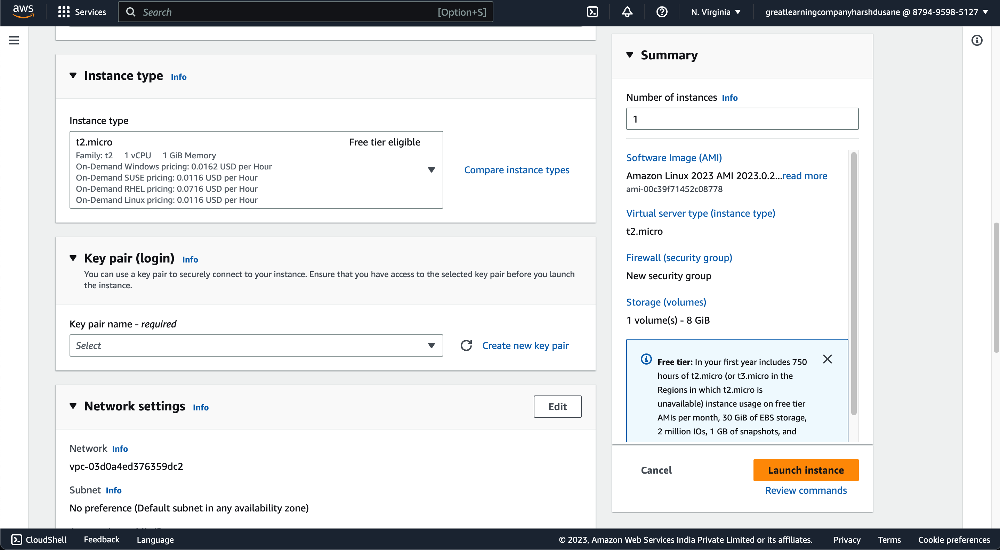

8. Please create a new key pair value. It will be downloaded. Please keep this handy. It will be used later to connect to ec2 instance .
   
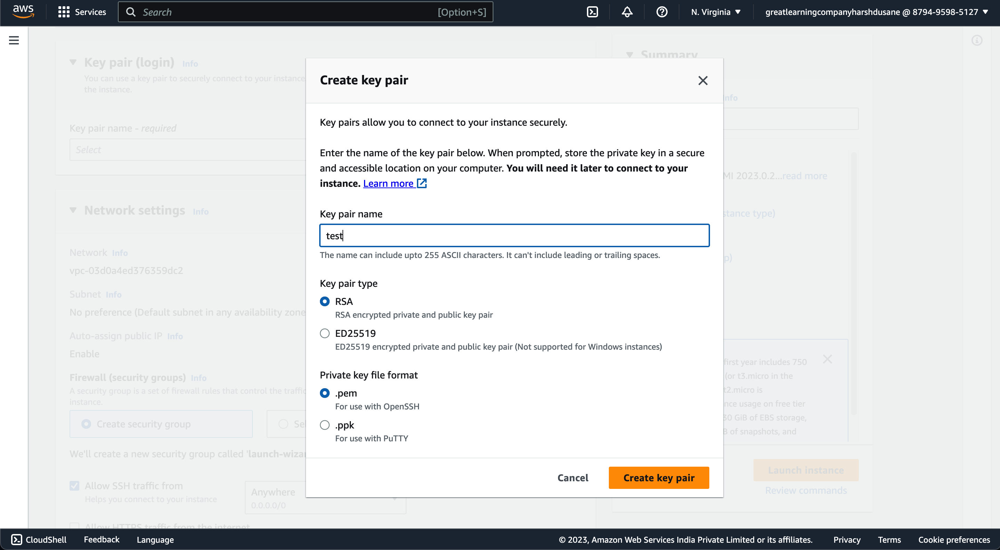

9. Please configure the network settings. This will include security group for configuring the firewall settings which is resposnible to control the traffic to the ec2 instance.

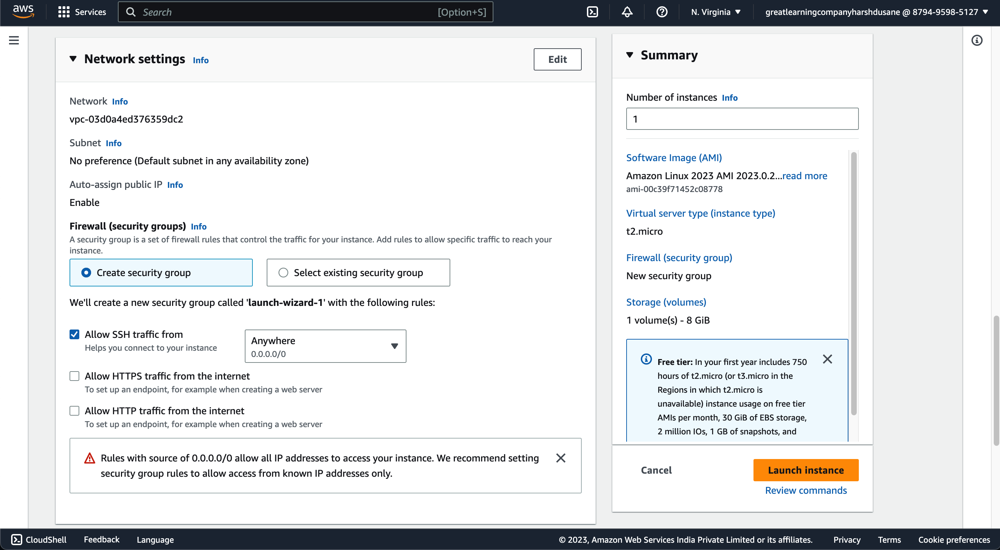

10. You can also configure the storage requirements for the instance as shown below.

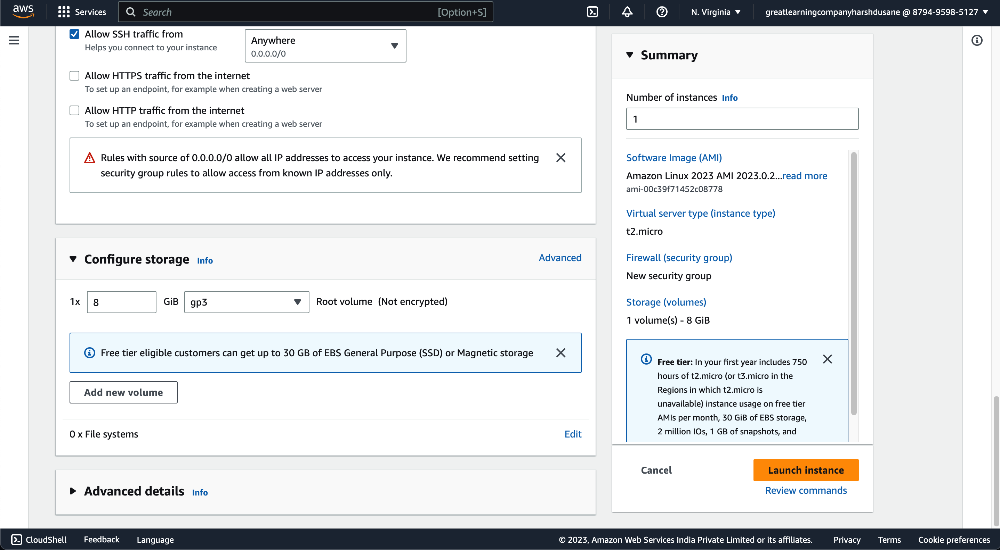

11. Once you click on `Launch Instance` button, instance will be created and upon sucessful instance creation below message will be displayed.

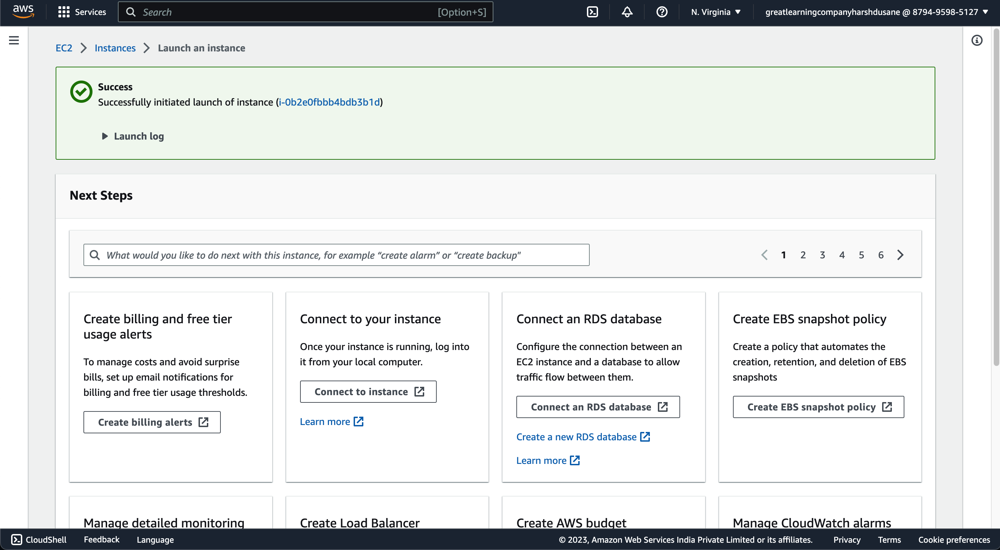

12. Once we have create the instance need to set inbound rule to access the node-red. We know that by default node-red will be running on 1880, hence we will edit the rule for same. 

    Click on the created instance and scroll below and look for security tab as mentioned below: 

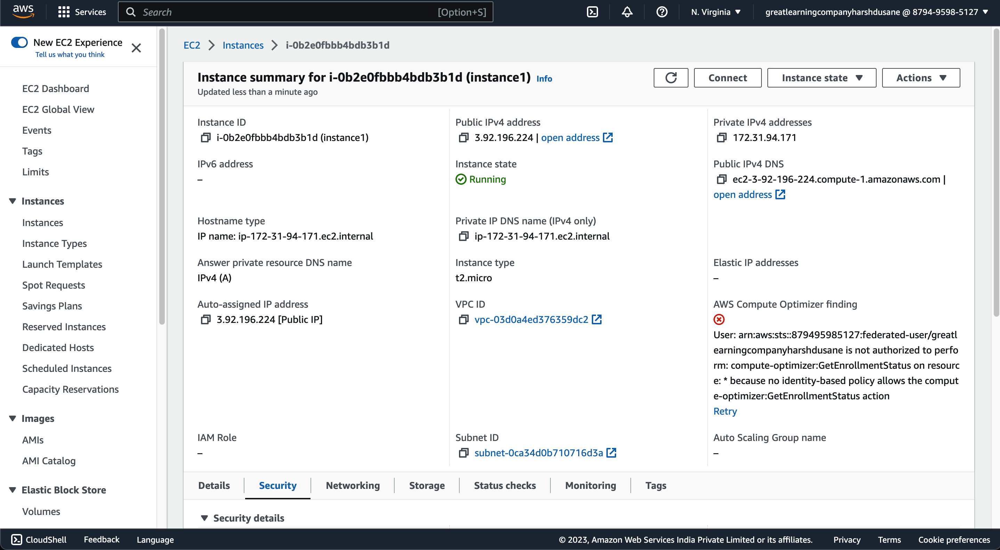

Click on the secuity group available there, it will take you to the next page whch will look as mentioned below: 

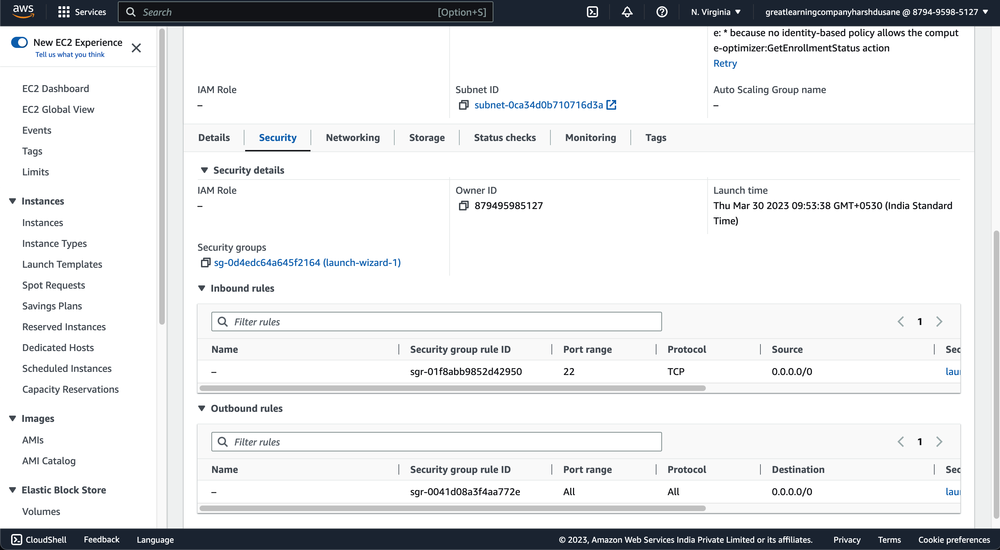

Click on `Edit Inbound rules` for editing the rules

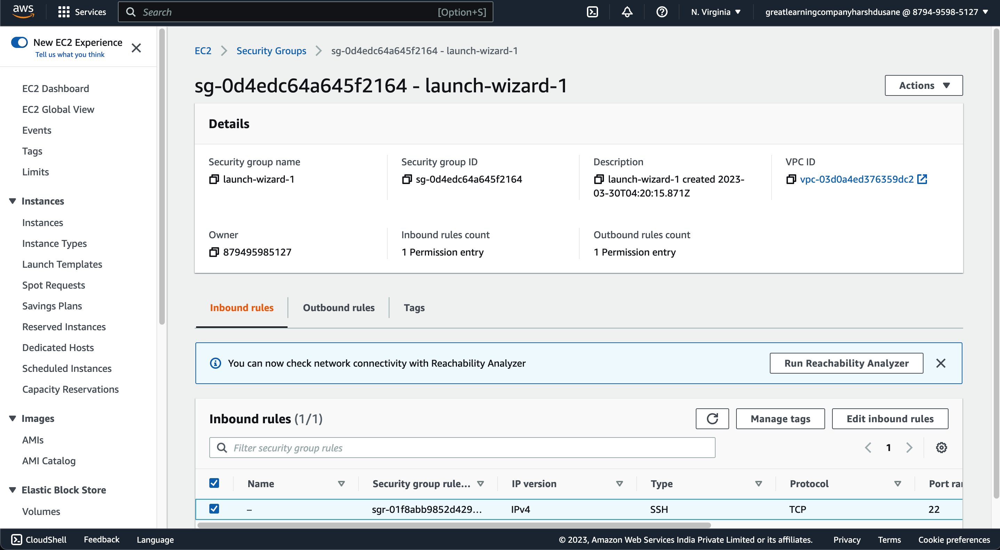

Please enter the rules as mentioned the below:

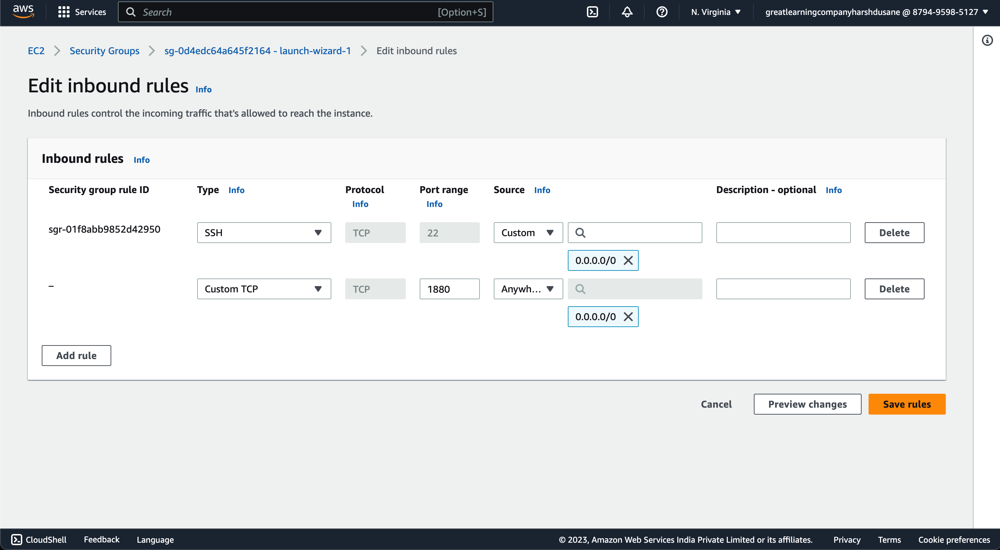


## <font color='blue'> Connecting to EC2 Instance </font>

In this section we will install Putty and connect  EC2 instance via putty    

1. Download the putty from the URL https://www.chiark.greenend.org.uk/~sgtatham/putty/latest.html if not already installed in your system. Choose appropriate msi based on your system configuration

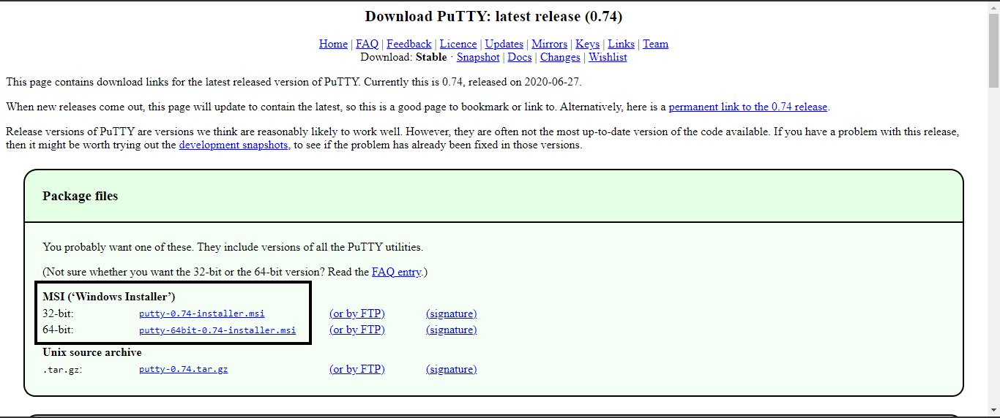


2. Once installed search for putty gen

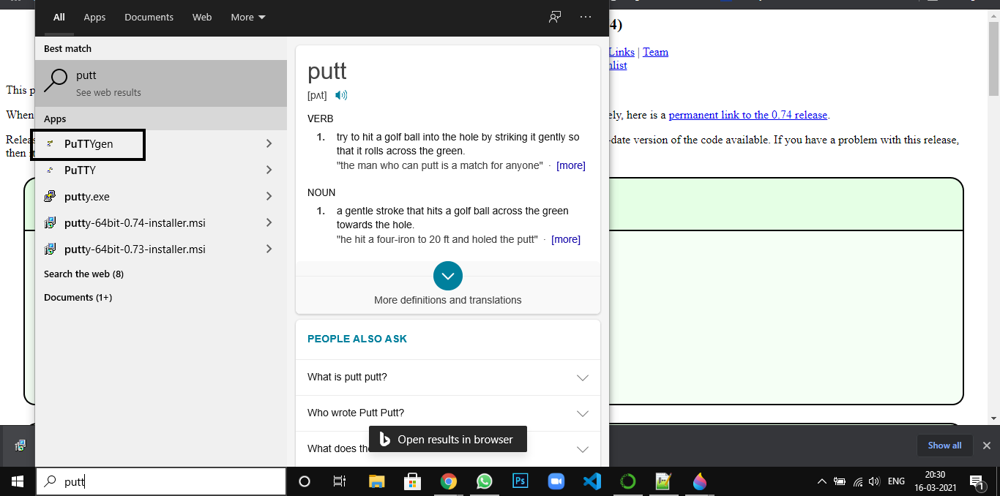
   


3.  Once you click on the Load , it will request you to locate the PEM file which you downloaded in the section 1 of the EC2 instance   
   
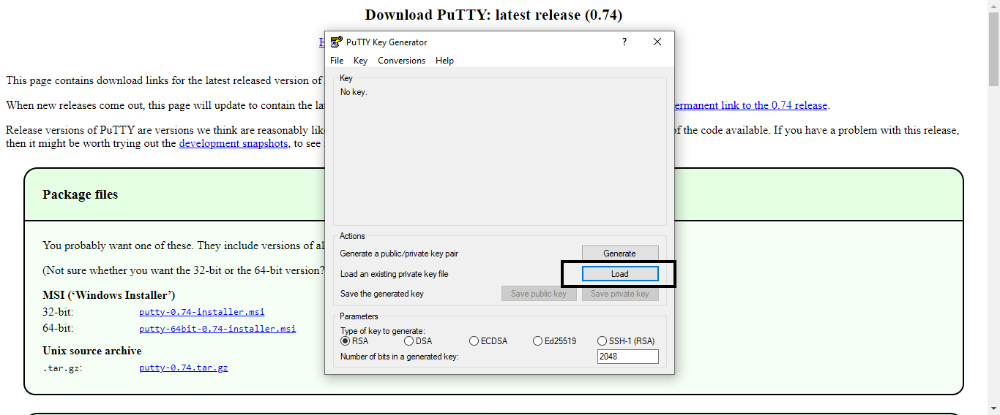
   


4. Once it is loaded , please click on button Save PrivateKey which will help to convert into PPK file   
   
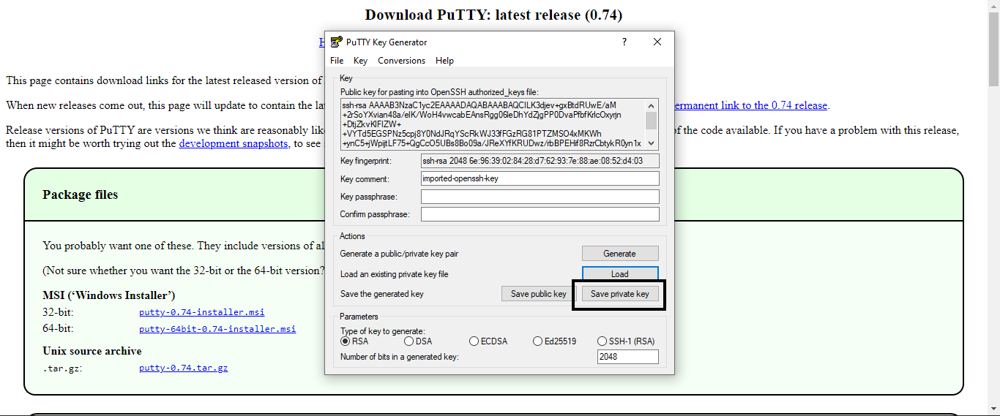
   


5. Go to the EC2 dashboard again , and select the instance you created and click on Connect   
   
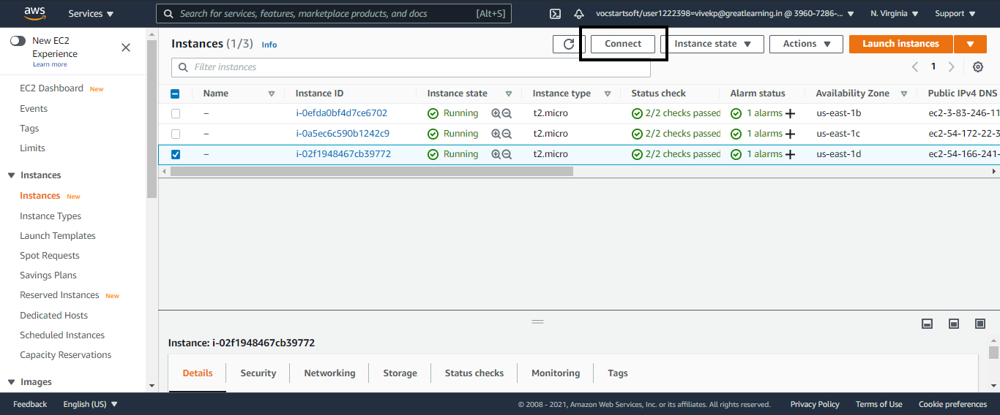
   


6. Inside connect , click on SSH client and copy the host name    
   
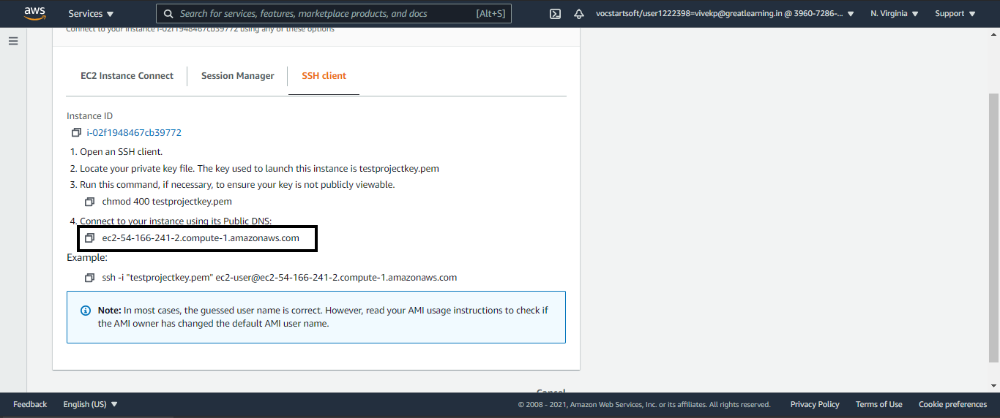
   


7. Open putty    
   
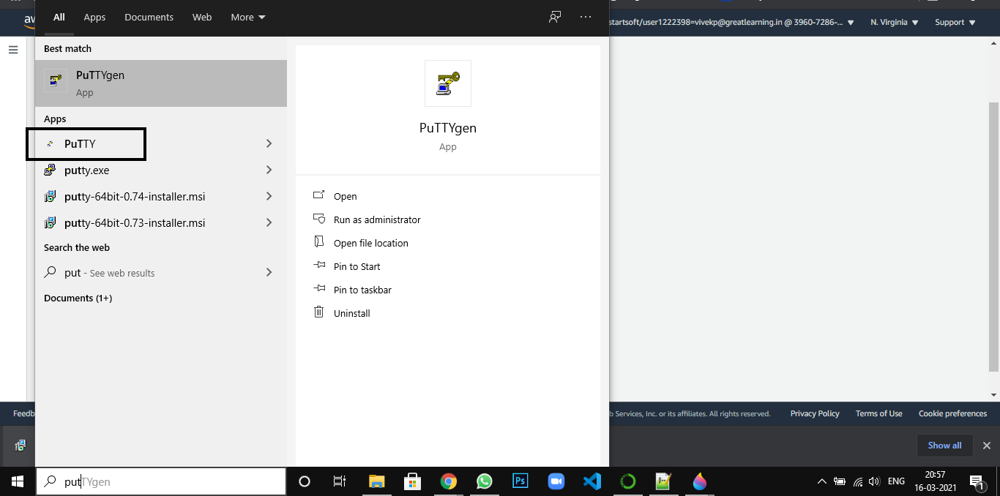
   


8. Paste the host name that you have copied in the putty    
   
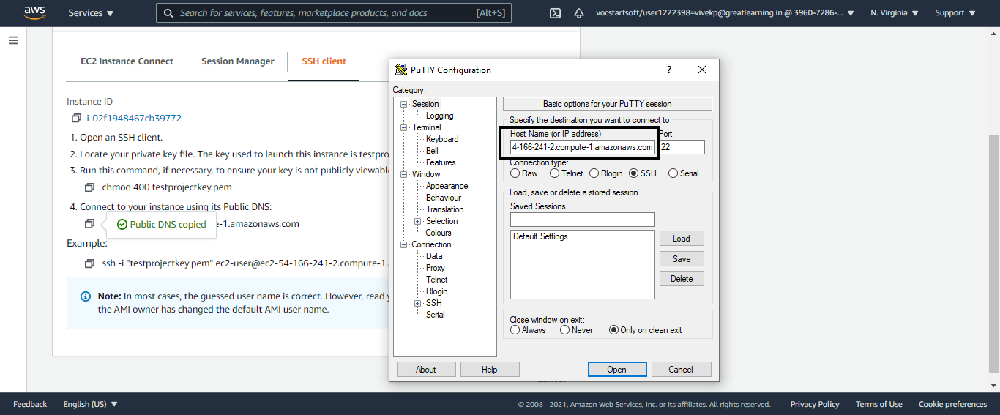
   


9. Go the SSH in the left hand side, expand it , go to Auth section  and then Browse the PPK file that you have generated in the putty gen and provide it here and click on open.   
   
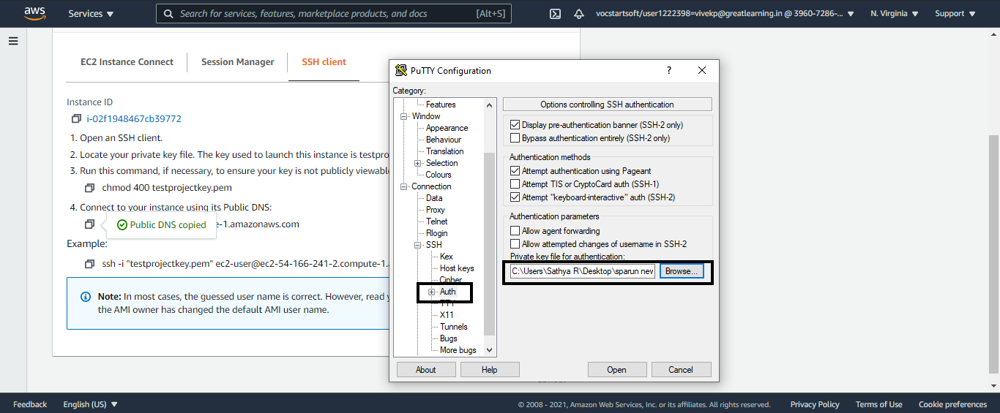
   


10. Provide the username as ec2-user ( which is available in the EC2 connect dashboard ) and press Enter.
   
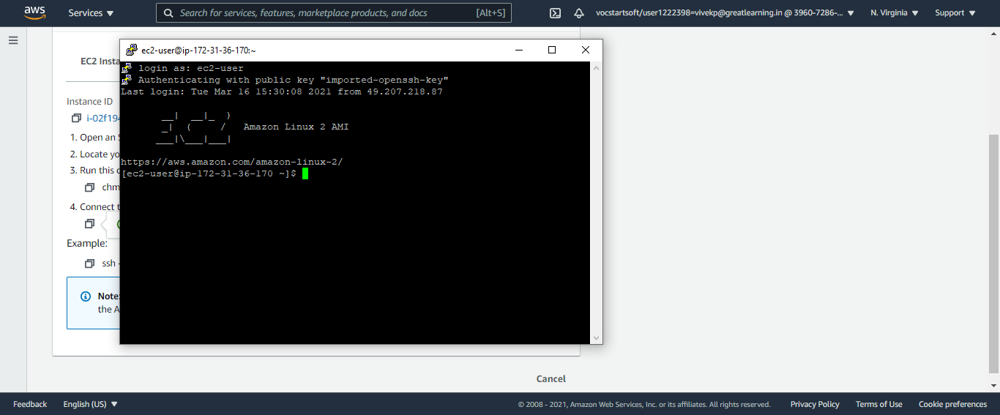
   
11. Now EC2 machine is connected   

# <font color='blue'> Node-Red : Flow Creation </font>


In this section, we are going to install a few node-red and related services in the newly created EC2 instance. 

Please follow the following steps to install NodeJS and node-red. NodeJS is pre-requisite for node-red install hence we will first finish the installation of NodeJS. 

You can follow the official AWS website to complete the installation. please find the link and steps below: 

    1. Oficial link : https://docs.aws.amazon.com/sdk-for-javascript/v2/developer-guide/setting-up-node-on-ec2-instance.html
    
    2. Once nodejs is installed, we will install the node-red on ec2 instance. Please find the relevant steps below: 
    
        `sudo npm install -g --unsafe-perm node-red`
    
    3. Once node-red is installed, start node-red by providing the command `node-red start`. 
    
    4. Visit http:<public ip>:1880 to access the node-red services. 
    
It will appear as mentioned below: 

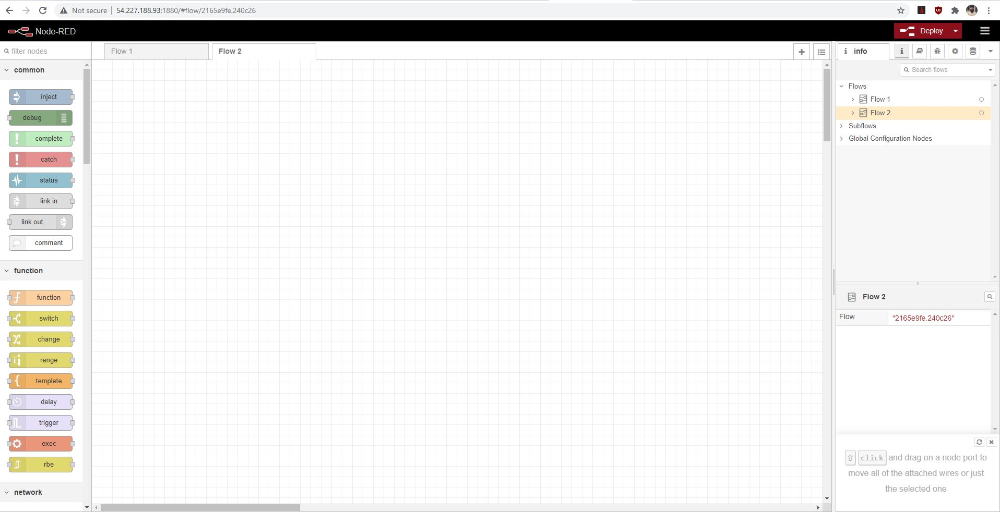
 



For our task we will be needing some of the libraries in node-red, we can install these libraries from `Manage Palette` section. 

Click on `Manage palette` --> choose `install` tab --> Search for `node-red-dashboard`. Choose the first option and click on install. 

Next we will install AWS related services. In the install section of `Manage palette` --> search for `node-red-contrib-aws`, click on install. 

After successfull operation of both services they will be available in the left pane of the node-red. Please find the relevant image below: 

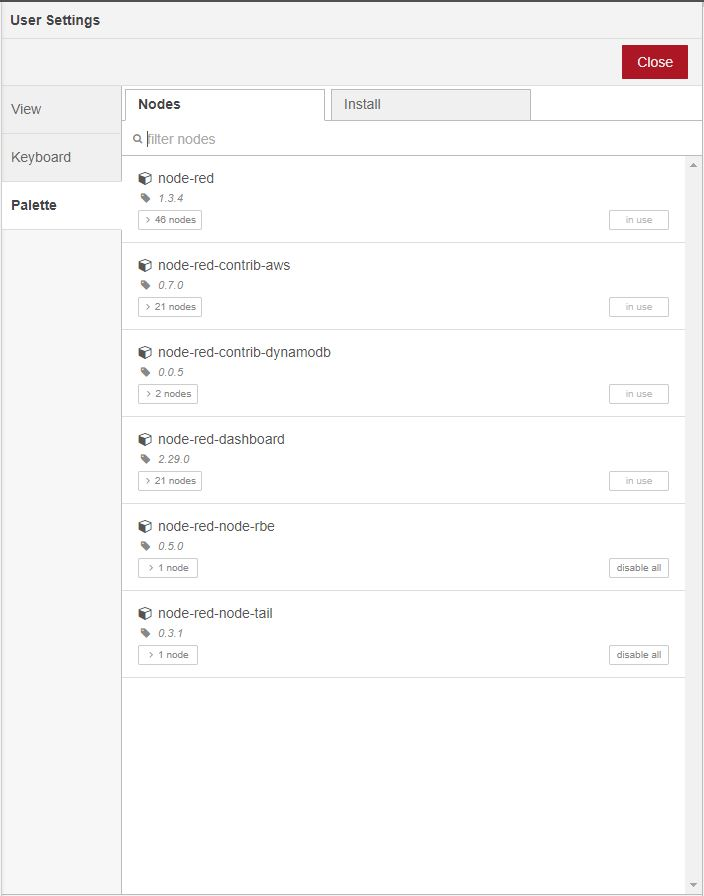



Now lets start with configuration of MQTT setup to recieve the raw data and anomaly data from IoT core and AWS sagemaker respectively. 

1. Choose MQTT-In and drop it in the working section. Click on MQTT node to intitiate the setup.

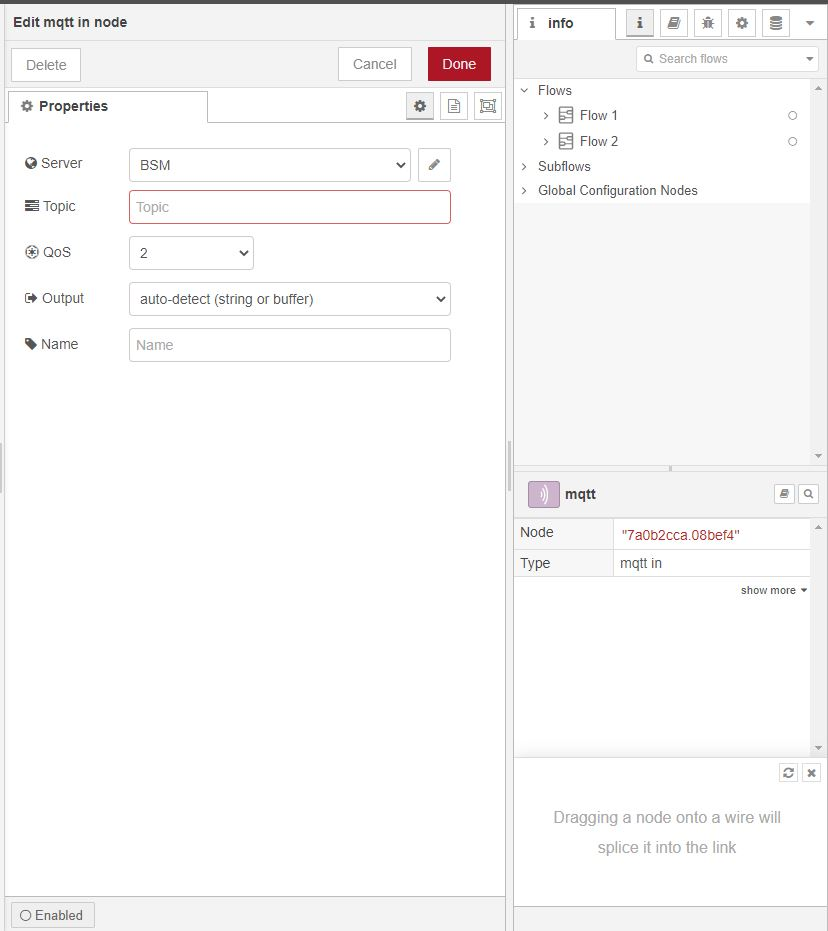



2. Click on the pencil button beside `Server`. On the next page, in the server field enter endpoint of the thing. Under port enter 8883. Choose TLS and click on pencil icon. 

3. Here upload the certificate of the thing. Upload private key of the thing and root certficate of the account. Under the name Provide the relevant name for your understanding.

After updating the files it will appear as following:

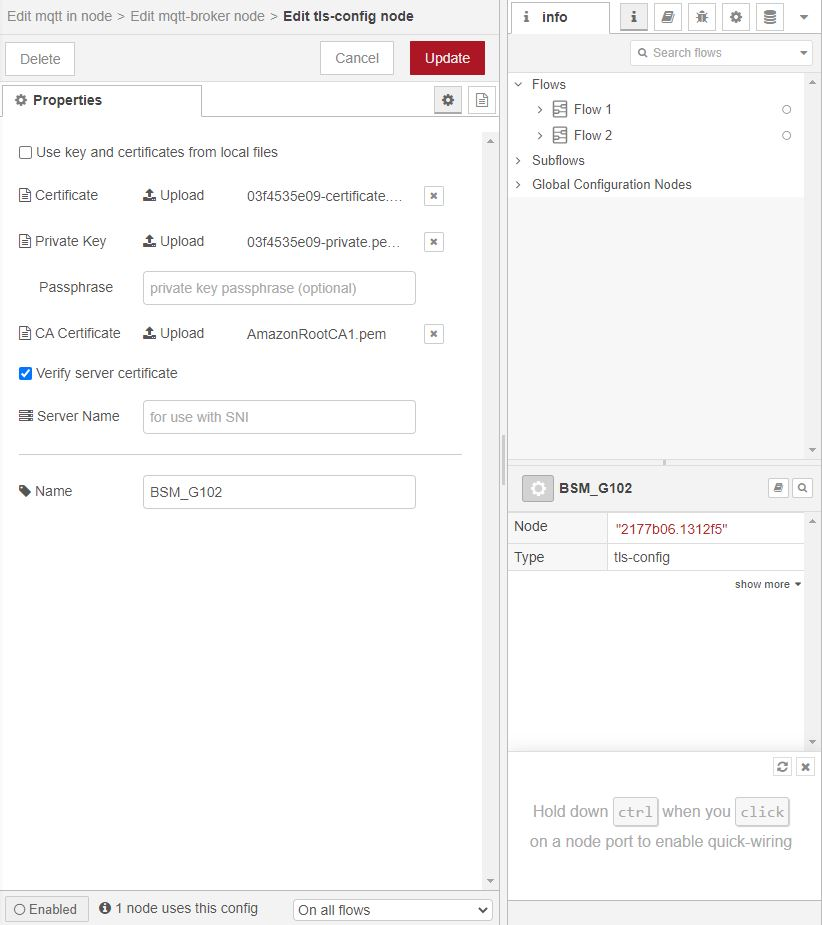



4. Click on Update and on the following page enter the details as mentioned in the following image. `Clientid` could be any generic string of yur choice. Keep everything else same. 

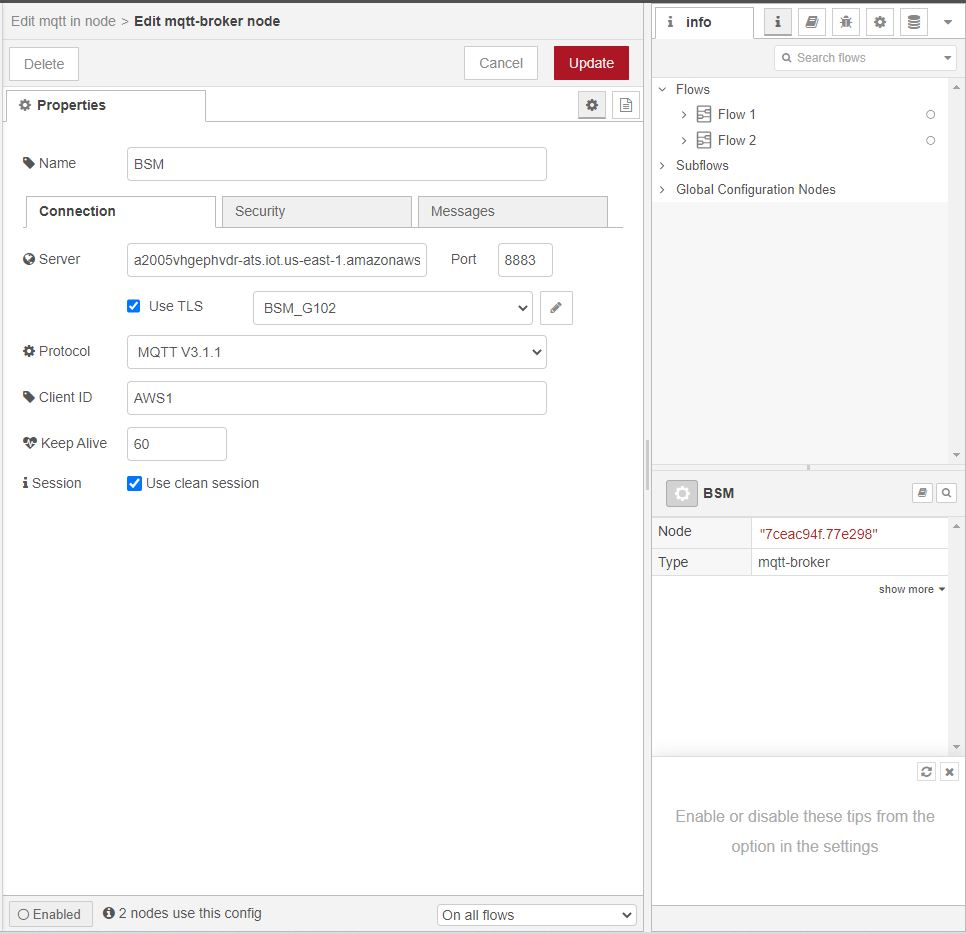



5. Enter the `topic` (Similar to what you have provided while running the `BedSideMonitor.py` script.) and make QoS = 0. Enter the name such as `Raw data` for this node. Once done it will look as mentioned below: 

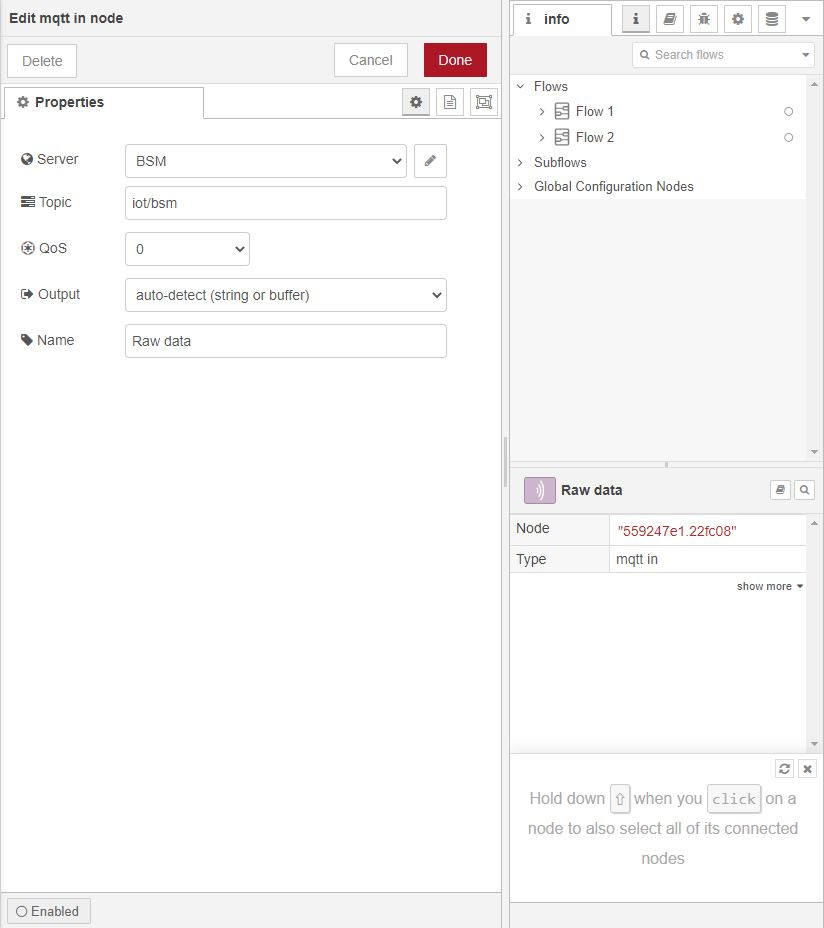



6. Similarly create another node which will subsrcibe to the `topic` which is pushing anomaly data over MQTT. (Topic name is available in Sagemaker notebook excercise. `topic: iot/bsm/anomaly`)

7. Next is to process the recieved data in JSON format and push it as an input for graph plotting. Following nodes are required to achieve this task. 

    * 2 Function nodes for JSON parsing
    * 2 switches to process the dfferent data types. 
    * 6 function nodes to process the values of these data types in the chart nodes
    * 6 chart nodes to plot the graph in two groups raw and anomaly.
    * 2 Debug nodes to see the output. 
    
8. Lets configure the dashboard nodes to see the data in line-charts. From the dashbard nodes pick chart and drop it inside te workflow field.  

9. Click on the node to start the setup. Under the group name field, click on pencil icon, in the next page enter name and under `Tab`, click on pencil icon and enter the Name and leave other field as it is. Please find he image below: 

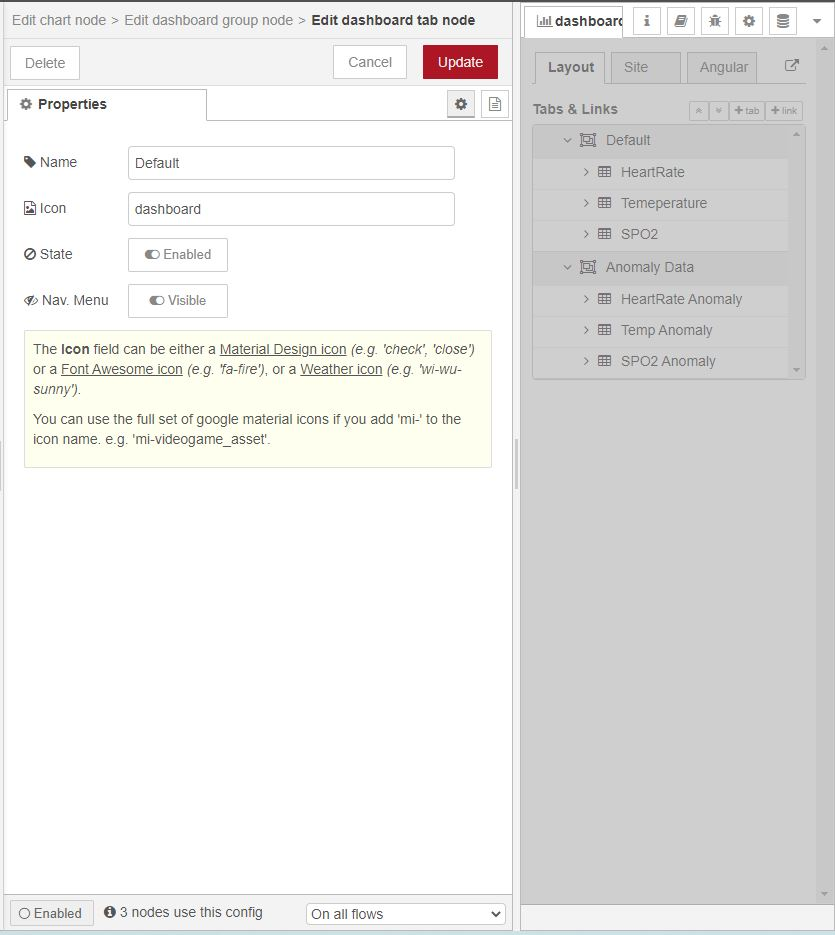



10. Enter the details as mentioned in the following image and provide the apprpriate name for chart. 

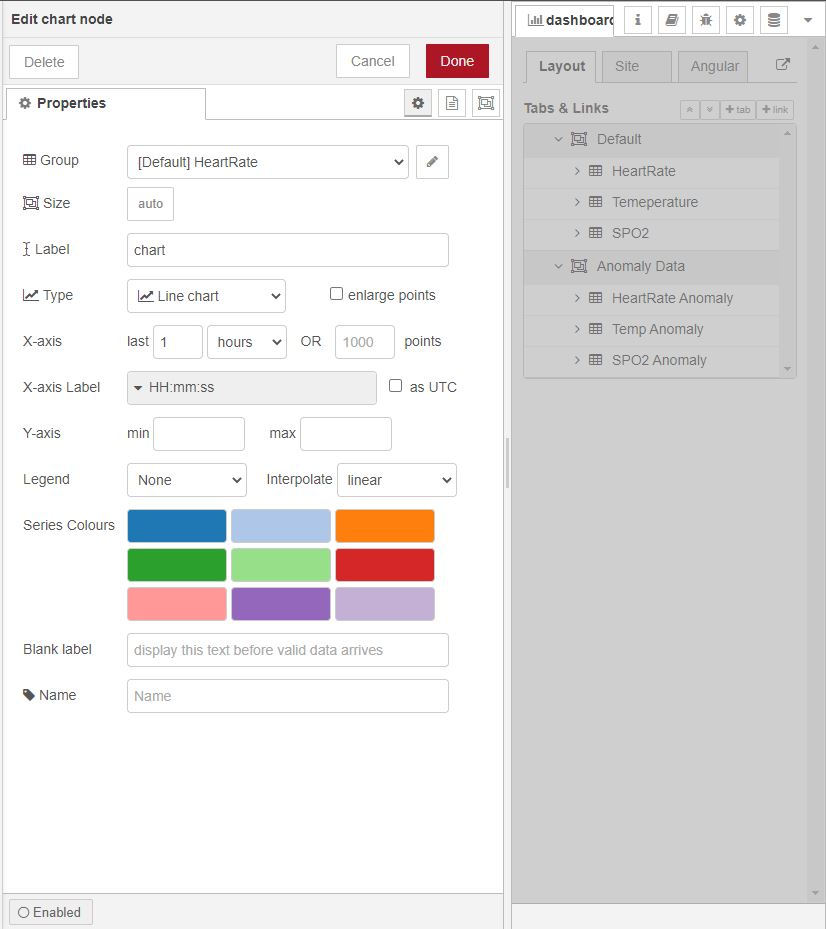
11. Repeat the same steps for raw and anomaly data charts. 



12. To create new tab or group in the dashbaord. Click on the dropdown available below Deploy button in the extreme right hand side. 

    * Choose `Dashboard`, under layout section you can add tabs. Under each tab there is an option to create groups. Please do the necessary setup as mentioned in the following image. 
    
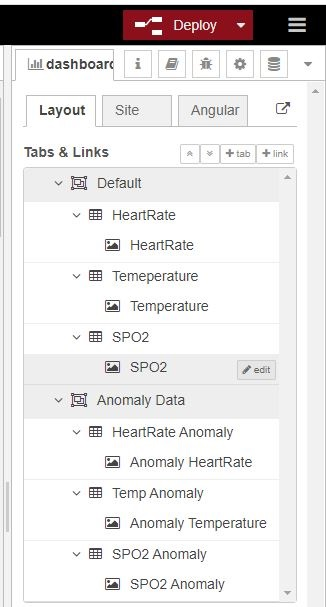
    
13. Alternatively you can take up the JSON code available in the notebook.


# <font color='blue'> Node-Red : Dashboard </font>


Now lets look at the data available in the charts. Click on the hyperlink arrow besdie angular as it is available in the following image. 

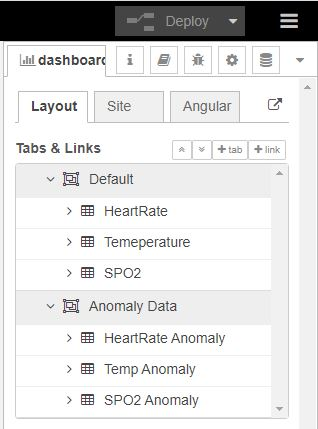

There are two dashboards are available which holds the default/raw data and anomaly data. Each of these tabs have three groups in each of the group there is one single line chart showing the linear data. Please look at the following image for the reference. Currently there is no data hence it is empty. 

Run the `BedSideMonitor.py` to push the data on IoT core, the same data will be ingested to IoT analytics service as well. 

Published raw data will be availble see on the Default tab once data ingestion is started. 

To view the Anomaly data, IoT analytics notebook needs to be executed. There is a line in the notebook which is publishing the anomaly data to a specific topic. One node in our flow has been subscribed to that topic and we are able to push the data on Anomaly tab. Graph for the same is available to view under the tab. 

Please find the relevant image after filling the data in the charts. 



Raw data

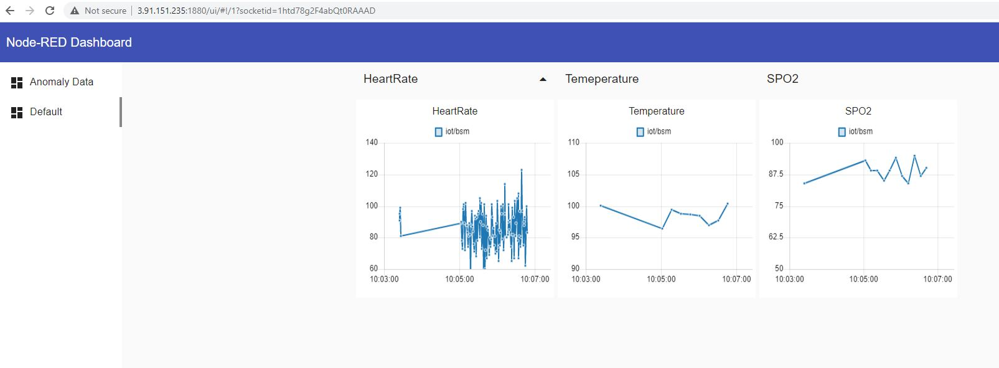




Anomaly data

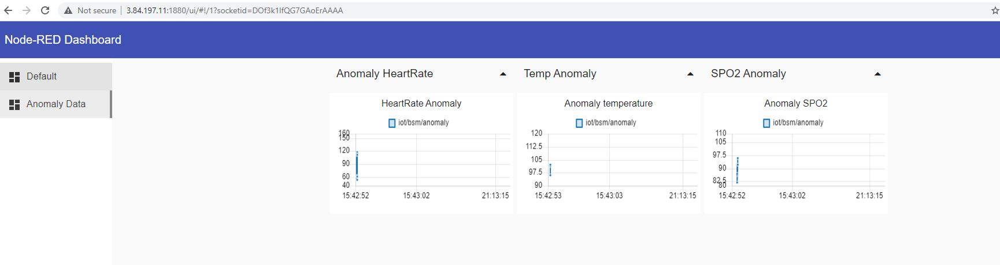

In this section we are going to see the final flow of the node-red interface after adding all the necessary nodes. 

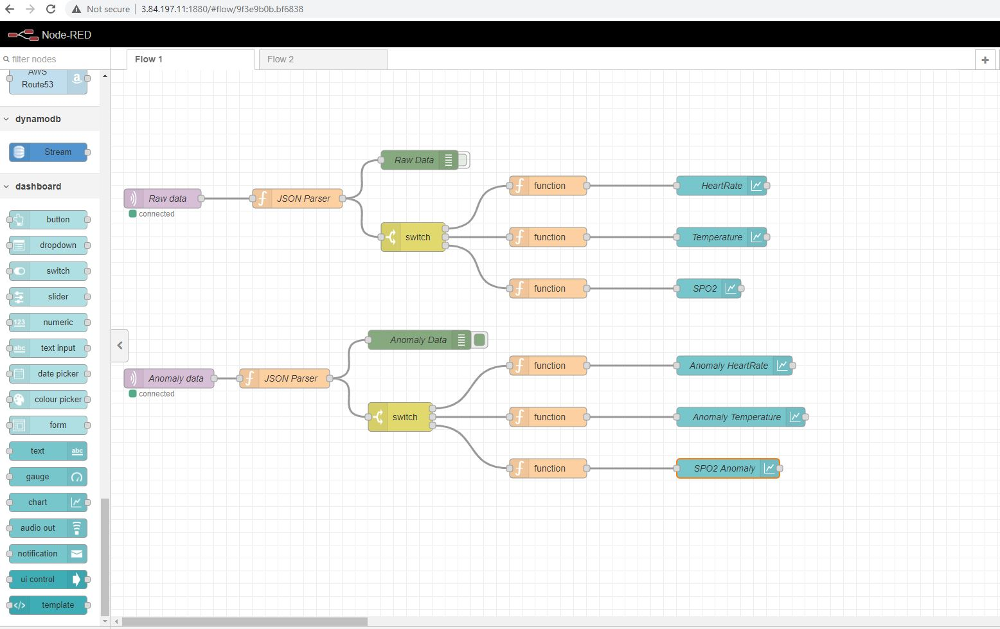

An image relevant to that is attached below. Also the relevant JSON code is also available below. After importing the JSON file, please make the necessary changes such as adding your own thing certificates, subscribing to the relevant topic. 




In [ ]:
[
    {
        "id": "9f3e9b0b.bf6838",
        "type": "tab",
        "label": "Flow 1",
        "disabled": false,
        "info": ""
    },
    {
        "id": "559247e1.22fc08",
        "type": "mqtt in",
        "z": "9f3e9b0b.bf6838",
        "name": "Raw data",
        "topic": "iot/bsm",
        "qos": "0",
        "datatype": "auto",
        "broker": "7ceac94f.77e298",
        "nl": false,
        "rap": true,
        "rh": 0,
        "x": 80,
        "y": 200,
        "wires": [
            [
                "c9bbf1e6.b3633"
            ]
        ]
    },
    {
        "id": "356e695.e063996",
        "type": "ui_chart",
        "z": "9f3e9b0b.bf6838",
        "name": "HeartRate",
        "group": "712799e5.97cf68",
        "order": 1,
        "width": "6",
        "height": "6",
        "label": "HeartRate",
        "chartType": "line",
        "legend": "true",
        "xformat": "HH:mm:ss",
        "interpolate": "linear",
        "nodata": "Data is Loadng ",
        "dot": true,
        "ymin": "40",
        "ymax": "160",
        "removeOlder": 1,
        "removeOlderPoints": "",
        "removeOlderUnit": "3600",
        "cutout": 0,
        "useOneColor": true,
        "useUTC": true,
        "colors": [
            "#1f77b4",
            "#aec7e8",
            "#c86814",
            "#2ca02c",
            "#98df8a",
            "#d62728",
            "#ff9896",
            "#9467bd",
            "#c5b0d5"
        ],
        "outputs": 1,
        "useDifferentColor": false,
        "x": 950,
        "y": 180,
        "wires": [
            []
        ]
    },
    {
        "id": "4317d425.fa7dbc",
        "type": "switch",
        "z": "9f3e9b0b.bf6838",
        "name": "",
        "property": "payload.datatype",
        "propertyType": "msg",
        "rules": [
            {
                "t": "eq",
                "v": "HeartRate",
                "vt": "str"
            },
            {
                "t": "eq",
                "v": "Temperature",
                "vt": "str"
            },
            {
                "t": "eq",
                "v": "SPO2",
                "vt": "str"
            }
        ],
        "checkall": "true",
        "repair": false,
        "outputs": 3,
        "x": 470,
        "y": 260,
        "wires": [
            [
                "f4d0a807.6feb98"
            ],
            [
                "803ee0c4.ed0d3"
            ],
            [
                "809f427b.7716e"
            ]
        ]
    },
    {
        "id": "f4d0a807.6feb98",
        "type": "function",
        "z": "9f3e9b0b.bf6838",
        "name": "",
        "func": "msg.payload = msg.payload.value\n\nreturn msg;",
        "outputs": 1,
        "noerr": 0,
        "initialize": "",
        "finalize": "",
        "libs": [],
        "x": 680,
        "y": 180,
        "wires": [
            [
                "356e695.e063996"
            ]
        ]
    },
    {
        "id": "ad004067.905b2",
        "type": "debug",
        "z": "9f3e9b0b.bf6838",
        "name": "Raw Data",
        "active": false,
        "tosidebar": true,
        "console": false,
        "tostatus": false,
        "complete": "payload",
        "targetType": "jsonata",
        "statusVal": "",
        "statusType": "auto",
        "x": 480,
        "y": 140,
        "wires": []
    },
    {
        "id": "c9bbf1e6.b3633",
        "type": "function",
        "z": "9f3e9b0b.bf6838",
        "name": "JSON Parser",
        "func": "msg.payload = JSON.parse(msg.payload)\n\nreturn msg;",
        "outputs": 1,
        "noerr": 0,
        "initialize": "",
        "finalize": "",
        "libs": [],
        "x": 290,
        "y": 200,
        "wires": [
            [
                "4317d425.fa7dbc",
                "ad004067.905b2"
            ]
        ]
    },
    {
        "id": "809f427b.7716e",
        "type": "function",
        "z": "9f3e9b0b.bf6838",
        "name": "",
        "func": "msg.payload = msg.payload.value\n\nreturn msg;",
        "outputs": 1,
        "noerr": 0,
        "initialize": "",
        "finalize": "",
        "libs": [],
        "x": 680,
        "y": 340,
        "wires": [
            [
                "bdf9a0a0.9c9b9"
            ]
        ]
    },
    {
        "id": "803ee0c4.ed0d3",
        "type": "function",
        "z": "9f3e9b0b.bf6838",
        "name": "",
        "func": "msg.payload = msg.payload.value\n\nreturn msg;",
        "outputs": 1,
        "noerr": 0,
        "initialize": "",
        "finalize": "",
        "libs": [],
        "x": 680,
        "y": 260,
        "wires": [
            [
                "b9cdac85.59912"
            ]
        ]
    },
    {
        "id": "b9cdac85.59912",
        "type": "ui_chart",
        "z": "9f3e9b0b.bf6838",
        "name": "Temperature",
        "group": "9be9509b.23af6",
        "order": 2,
        "width": "6",
        "height": "6",
        "label": "Temperature",
        "chartType": "line",
        "legend": "true",
        "xformat": "HH:mm:ss",
        "interpolate": "linear",
        "nodata": "Data is Loadng ",
        "dot": true,
        "ymin": "90",
        "ymax": "110",
        "removeOlder": 1,
        "removeOlderPoints": "",
        "removeOlderUnit": "3600",
        "cutout": 0,
        "useOneColor": true,
        "useUTC": true,
        "colors": [
            "#1f77b4",
            "#aec7e8",
            "#bb6316",
            "#2ca02c",
            "#98df8a",
            "#d62728",
            "#ff9896",
            "#9467bd",
            "#c5b0d5"
        ],
        "outputs": 1,
        "useDifferentColor": false,
        "x": 950,
        "y": 260,
        "wires": [
            []
        ]
    },
    {
        "id": "bdf9a0a0.9c9b9",
        "type": "ui_chart",
        "z": "9f3e9b0b.bf6838",
        "name": "SPO2",
        "group": "1c8d4bfb.ca03e4",
        "order": 1,
        "width": "6",
        "height": "6",
        "label": "SPO2",
        "chartType": "line",
        "legend": "true",
        "xformat": "HH:mm:ss",
        "interpolate": "linear",
        "nodata": "Data is Loadng ",
        "dot": true,
        "ymin": "50",
        "ymax": "100",
        "removeOlder": 1,
        "removeOlderPoints": "",
        "removeOlderUnit": "3600",
        "cutout": 0,
        "useOneColor": true,
        "useUTC": true,
        "colors": [
            "#1f77b4",
            "#aec7e8",
            "#ff7f0e",
            "#2ca02c",
            "#98df8a",
            "#8f2424",
            "#ff9896",
            "#9467bd",
            "#c5b0d5"
        ],
        "outputs": 1,
        "useDifferentColor": false,
        "x": 930,
        "y": 340,
        "wires": [
            []
        ]
    },
    {
        "id": "6808c078.6d9d8",
        "type": "mqtt in",
        "z": "9f3e9b0b.bf6838",
        "name": "Anomaly data",
        "topic": "iot/bsm/anomaly",
        "qos": "0",
        "datatype": "auto",
        "broker": "7ceac94f.77e298",
        "nl": false,
        "rap": true,
        "rh": 0,
        "x": 90,
        "y": 480,
        "wires": [
            [
                "7d50facf.d970c4"
            ]
        ]
    },
    {
        "id": "f22e40a9.42be8",
        "type": "switch",
        "z": "9f3e9b0b.bf6838",
        "name": "",
        "property": "payload.datatype",
        "propertyType": "msg",
        "rules": [
            {
                "t": "eq",
                "v": "HeartRate",
                "vt": "str"
            },
            {
                "t": "eq",
                "v": "Temperature",
                "vt": "str"
            },
            {
                "t": "eq",
                "v": "SPO2",
                "vt": "str"
            }
        ],
        "checkall": "true",
        "repair": false,
        "outputs": 3,
        "x": 450,
        "y": 540,
        "wires": [
            [
                "15ac34e.2bc18cb"
            ],
            [
                "e41741a5.added"
            ],
            [
                "c8cfde36.f259e"
            ]
        ]
    },
    {
        "id": "15ac34e.2bc18cb",
        "type": "function",
        "z": "9f3e9b0b.bf6838",
        "name": "",
        "func": "msg.payload = msg.payload.value\n\nreturn msg;",
        "outputs": 1,
        "noerr": 0,
        "initialize": "",
        "finalize": "",
        "libs": [],
        "x": 680,
        "y": 460,
        "wires": [
            [
                "46ced8d1.767708"
            ]
        ]
    },
    {
        "id": "e41741a5.added",
        "type": "function",
        "z": "9f3e9b0b.bf6838",
        "name": "",
        "func": "msg.payload = msg.payload.value\n\nreturn msg;",
        "outputs": 1,
        "noerr": 0,
        "initialize": "",
        "finalize": "",
        "libs": [],
        "x": 680,
        "y": 540,
        "wires": [
            [
                "786ca0a6.0e08a"
            ]
        ]
    },
    {
        "id": "c8cfde36.f259e",
        "type": "function",
        "z": "9f3e9b0b.bf6838",
        "name": "",
        "func": "msg.payload = msg.payload.value\n\nreturn msg;",
        "outputs": 1,
        "noerr": 0,
        "initialize": "",
        "finalize": "",
        "libs": [],
        "x": 680,
        "y": 620,
        "wires": [
            [
                "751a4151.d59a2"
            ]
        ]
    },
    {
        "id": "46ced8d1.767708",
        "type": "ui_chart",
        "z": "9f3e9b0b.bf6838",
        "name": "Anomaly HeartRate",
        "group": "4f5ee837.1614a8",
        "order": 0,
        "width": 0,
        "height": 0,
        "label": "HeartRate Anomaly ",
        "chartType": "line",
        "legend": "true",
        "xformat": "HH:mm:ss",
        "interpolate": "linear",
        "nodata": "Data is loading ",
        "dot": true,
        "ymin": "40",
        "ymax": "160",
        "removeOlder": 1,
        "removeOlderPoints": "",
        "removeOlderUnit": "3600",
        "cutout": 0,
        "useOneColor": false,
        "useUTC": true,
        "colors": [
            "#1f77b4",
            "#aec7e8",
            "#ff7f0e",
            "#2ca02c",
            "#98df8a",
            "#d31717",
            "#ff9896",
            "#9467bd",
            "#c5b0d5"
        ],
        "outputs": 1,
        "useDifferentColor": false,
        "x": 970,
        "y": 460,
        "wires": [
            []
        ]
    },
    {
        "id": "786ca0a6.0e08a",
        "type": "ui_chart",
        "z": "9f3e9b0b.bf6838",
        "name": "Anomaly Temperature",
        "group": "15f0a370.8f658d",
        "order": 0,
        "width": 0,
        "height": 0,
        "label": "Anomaly temperature",
        "chartType": "line",
        "legend": "true",
        "xformat": "HH:mm:ss",
        "interpolate": "linear",
        "nodata": "",
        "dot": true,
        "ymin": "90",
        "ymax": "120",
        "removeOlder": 1,
        "removeOlderPoints": "",
        "removeOlderUnit": "3600",
        "cutout": 0,
        "useOneColor": false,
        "useUTC": true,
        "colors": [
            "#1f77b4",
            "#aec7e8",
            "#ff7f0e",
            "#2ca02c",
            "#98df8a",
            "#b20606",
            "#ff9896",
            "#9467bd",
            "#c5b0d5"
        ],
        "outputs": 1,
        "useDifferentColor": false,
        "x": 980,
        "y": 540,
        "wires": [
            []
        ]
    },
    {
        "id": "751a4151.d59a2",
        "type": "ui_chart",
        "z": "9f3e9b0b.bf6838",
        "name": "SPO2 Anomaly",
        "group": "29688b02.57ada4",
        "order": 0,
        "width": 0,
        "height": 0,
        "label": "Anomaly SPO2 ",
        "chartType": "line",
        "legend": "true",
        "xformat": "HH:mm:ss",
        "interpolate": "linear",
        "nodata": "",
        "dot": true,
        "ymin": "80",
        "ymax": "110",
        "removeOlder": 1,
        "removeOlderPoints": "",
        "removeOlderUnit": "3600",
        "cutout": 0,
        "useOneColor": false,
        "useUTC": true,
        "colors": [
            "#1f77b4",
            "#aec7e8",
            "#ff7f0e",
            "#2ca02c",
            "#98df8a",
            "#bb0c0c",
            "#ff9896",
            "#9467bd",
            "#c5b0d5"
        ],
        "outputs": 1,
        "useDifferentColor": false,
        "x": 960,
        "y": 620,
        "wires": [
            []
        ]
    },
    {
        "id": "4088787e.018d18",
        "type": "debug",
        "z": "9f3e9b0b.bf6838",
        "name": "Anomaly Data",
        "active": true,
        "tosidebar": true,
        "console": false,
        "tostatus": false,
        "complete": "payload",
        "targetType": "jsonata",
        "statusVal": "",
        "statusType": "auto",
        "x": 480,
        "y": 420,
        "wires": []
    },
    {
        "id": "7d50facf.d970c4",
        "type": "function",
        "z": "9f3e9b0b.bf6838",
        "name": "JSON Parser",
        "func": "msg.payload = JSON.parse(msg.payload)\n\nreturn msg;",
        "outputs": 1,
        "noerr": 0,
        "initialize": "",
        "finalize": "",
        "libs": [],
        "x": 270,
        "y": 480,
        "wires": [
            [
                "f22e40a9.42be8",
                "4088787e.018d18"
            ]
        ]
    },
    {
        "id": "7ceac94f.77e298",
        "type": "mqtt-broker",
        "name": "BSM",
        "broker": "a2005vhgephvdr-ats.iot.us-east-1.amazonaws.com",
        "port": "8883",
        "tls": "2177b06.1312f5",
        "clientid": "AWS1",
        "usetls": true,
        "protocolVersion": "4",
        "keepalive": "60",
        "cleansession": true,
        "birthTopic": "",
        "birthQos": "0",
        "birthPayload": "",
        "birthMsg": {},
        "closeTopic": "",
        "closeQos": "0",
        "closePayload": "",
        "closeMsg": {},
        "willTopic": "",
        "willQos": "0",
        "willPayload": "",
        "willMsg": {},
        "sessionExpiry": ""
    },
    {
        "id": "712799e5.97cf68",
        "type": "ui_group",
        "name": "HeartRate",
        "tab": "c19667cc.2fb118",
        "order": 1,
        "disp": true,
        "width": "6",
        "collapse": true
    },
    {
        "id": "9be9509b.23af6",
        "type": "ui_group",
        "name": "Temeperature",
        "tab": "c19667cc.2fb118",
        "order": 2,
        "disp": true,
        "width": "6",
        "collapse": true
    },
    {
        "id": "1c8d4bfb.ca03e4",
        "type": "ui_group",
        "name": "SPO2",
        "tab": "c19667cc.2fb118",
        "order": 3,
        "disp": true,
        "width": "6",
        "collapse": true
    },
    {
        "id": "4f5ee837.1614a8",
        "type": "ui_group",
        "name": "Anomaly HeartRate",
        "tab": "3e00bcb2.3ba6c4",
        "order": 1,
        "disp": true,
        "width": "6",
        "collapse": true
    },
    {
        "id": "15f0a370.8f658d",
        "type": "ui_group",
        "name": "Temp Anomaly",
        "tab": "3e00bcb2.3ba6c4",
        "order": 2,
        "disp": true,
        "width": "6",
        "collapse": true
    },
    {
        "id": "29688b02.57ada4",
        "type": "ui_group",
        "name": "SPO2 Anomaly",
        "tab": "3e00bcb2.3ba6c4",
        "order": 3,
        "disp": true,
        "width": "6",
        "collapse": true
    },
    {
        "id": "2177b06.1312f5",
        "type": "tls-config",
        "name": "BSM_G102",
        "cert": "",
        "key": "",
        "ca": "",
        "certname": "03f4535e09-certificate.pem.crt",
        "keyname": "03f4535e09-private.pem.key",
        "caname": "AmazonRootCA1.pem",
        "servername": "",
        "verifyservercert": true
    },
    {
        "id": "c19667cc.2fb118",
        "type": "ui_tab",
        "name": "Default",
        "icon": "dashboard",
        "order": 1,
        "disabled": false,
        "hidden": false
    },
    {
        "id": "3e00bcb2.3ba6c4",
        "type": "ui_tab",
        "name": "Anomaly Data",
        "icon": "dashboard",
        "order": 2,
        "disabled": false,
        "hidden": false
    }
]